<a href="https://colab.research.google.com/github/sunmarknatecom/01_markcv/blob/master/step4_predict_subm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PREDICT BY THE LOADED MODEL

### 주의: 모듈을 먼저 임포트 하시오.

###       CUSTOM OBJECT를 먼저 정의하시오.

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

In [1]:
!pip install pydicom pynrrd

# DATA PREPROCESSING
from glob import glob
import numpy as np
import pydicom, cv2, os
from pydicom.pixel_data_handlers.util import apply_modality_lut, apply_voi_lut
import matplotlib.pyplot as plt
from PIL import Image

# DEEP LEARNING MODULES
import tensorflow as tf
from keras import backend as K
from keras.losses import binary_crossentropy
from keras.optimizers import adam_v2

from keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, BatchNormalization, concatenate
from keras.models import Model
from skimage.metrics import structural_similarity as ssim

from glob import glob
import cv2
import copy
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil

     |████████████████████████████████| 2.0 MB 10.2 MB/s 


In [2]:
# Reference
# https://www.sciencedirect.com/science/article/pii/S2665963821000269
# https://github.com/SoftwareImpacts/SIMPAC-2021-46

import tensorflow as tf
import keras.backend as K
from keras.losses import binary_crossentropy

beta = 0.25
alpha = 0.25
gamma = 2
epsilon = 1e-5
smooth = 1

def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + K.epsilon()) / (K.sum(y_true_f) + K.sum(y_pred_f) + K.epsilon())

def generalized_dice_coefficient(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - generalized_dice_coefficient(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    loss = binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss / 2.0

In [3]:
model = tf.keras.models.load_model("/content/drive/MyDrive/segmentation/save_model/my_model_A.h5", custom_objects={'bce_dice_loss': bce_dice_loss,'generalized_dice_coefficient': generalized_dice_coefficient} )

In [4]:
root = "/content/drive/MyDrive/segmentation/data/seg_050/seg_050_1/dicom/"

f_list = sorted(glob(root+"*.dcm"))

pred_imgs = []

def img_norm(path_d, window_center=-450, window_width=1500):
    obj = pydicom.dcmread(path_d)
    temp_arr = obj.pixel_array
    s = int(obj.RescaleSlope)
    b = int(obj.RescaleIntercept)
    temp_arr = s * temp_arr + b
    obj.WindowCenter = window_center
    obj.WindowWidth = window_width
    arr = apply_voi_lut(temp_arr, obj)
    Max_val = np.max(arr)
    Min_val = np.min(arr)
    Up_arr = arr - Min_val
    Dn_arr = Max_val - Min_val
    nor_arr = Up_arr / Dn_arr
    del obj, temp_arr, arr, Up_arr
    return nor_arr

for path in f_list:
    ret_arr = img_norm(path)
    pred_imgs.append(ret_arr)
    del ret_arr

predictions = np.array(pred_imgs)

In [5]:
pred_img = model.predict(predictions)

In [6]:
np.shape(pred_img)

(291, 512, 512, 1)

In [7]:
plt_imgs = np.squeeze(pred_img)

In [8]:
plt_imgs[plt_imgs < 0.5] = 0

In [9]:
plt_imgs[plt_imgs >= 0.5] = 1

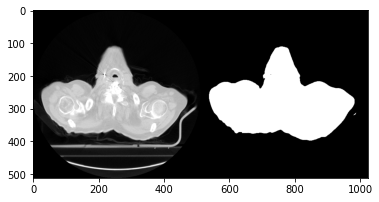

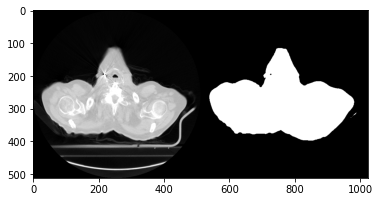

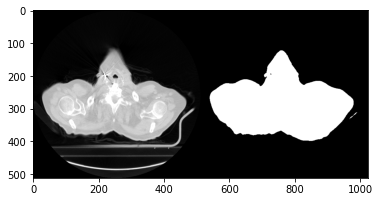

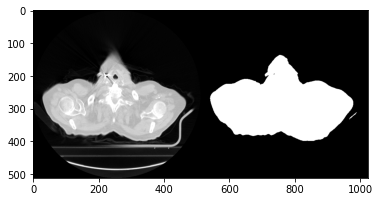

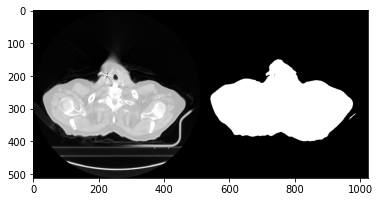

...

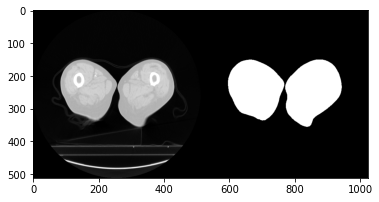

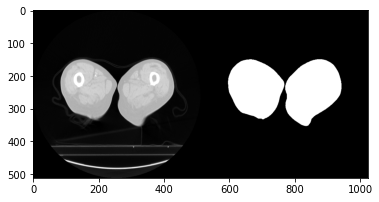

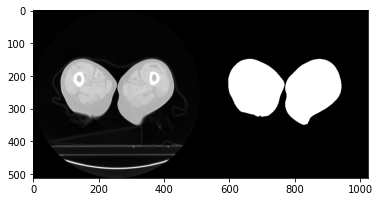

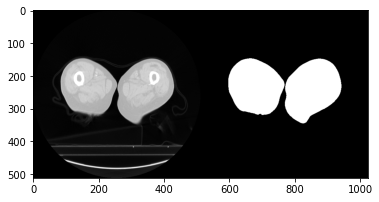

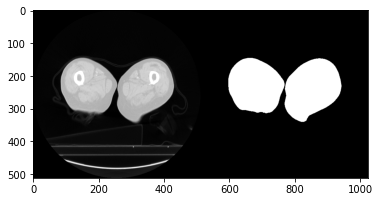

In [11]:
for i in range(len(plt_imgs)):
    out_imgs = np.hstack([predictions[i], plt_imgs[i]])
    plt.imshow(out_imgs, cmap=plt.cm.gray)
    plt.show()

## transform to nrrd file

In [ ]:
data, header = nrrd.read('/content/drive/MyDrive/segmentation/data/seg_017/seg_017_1/mask_slicer/seg_017_1_mask.nrrd', index_order = 'C')

pred_imgs = glob('/content/drive/MyDrive/segmentation/data/seg_017/seg_017_1/dicom/*.dcm')

pred_arr = []

for elem in pred_imgs:
    temp_obj = pydicom.dcmread(elem)
    arr = temp_obj.pixel_array
    Max_val = np.max(arr)
    Min_val = np.min(arr)
    Up_arr = arr - Min_val
    Dn_arr = Max_val - Min_val
    nor_arr = Up_arr / Dn_arr
    pred_arr.append(nor_arr)
    del temp_obj, arr, Up_arr, nor_arr